In [1]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1cewMfusmPjYWbrnuJRuKhPMwRe_b9PaT' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1cewMfusmPjYWbrnuJRuKhPMwRe_b9PaT" -O yolov4.weights
!rm -rf /tmp/cookies.txt
!ls -la ./yolov4.weights

--2022-04-09 09:10:52--  https://docs.google.com/uc?export=download&confirm=t&id=1cewMfusmPjYWbrnuJRuKhPMwRe_b9PaT
Resolving docs.google.com (docs.google.com)... 2607:f8b0:4009:80a::200e, 142.250.190.78
Connecting to docs.google.com (docs.google.com)|2607:f8b0:4009:80a::200e|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0s-7k-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/4h3sh24drr2pg34koog3fm208irb57ha/1649509800000/14889149095783116612/*/1cewMfusmPjYWbrnuJRuKhPMwRe_b9PaT?e=download [following]
--2022-04-09 09:10:52--  https://doc-0s-7k-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/4h3sh24drr2pg34koog3fm208irb57ha/1649509800000/14889149095783116612/*/1cewMfusmPjYWbrnuJRuKhPMwRe_b9PaT?e=download
Resolving doc-0s-7k-docs.googleusercontent.com (doc-0s-7k-docs.googleusercontent.com)... 2607:f8b0:4009:819::2001, 142.250.190.97
Connecting to doc-0s-7k-docs.googleusercontent.com (doc-0s-7

In [2]:
!convert-darknet-weights yolov4.weights -o yolov4.h5
!ls -la ./yolov4.h5

2022-04-09 09:15:20.529224: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
Number of remaining values to load from darknet weights file: 0
-rw-r--r--  1 deepakduggirala  staff  258395584 Apr  9 09:15 ./yolov4.h5


In [3]:
import tensorflow as tf

from tf2_yolov4.anchors import YOLOV4_ANCHORS
from tf2_yolov4.model import YOLOv4

HEIGHT, WIDTH = (640, 960)

--2022-04-09 09:34:45--  https://github.com/sicara/tf2-yolov4/raw/master/notebooks/images/cars.jpg
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/sicara/tf2-yolov4/master/notebooks/images/cars.jpg [following]
--2022-04-09 09:34:45--  https://raw.githubusercontent.com/sicara/tf2-yolov4/master/notebooks/images/cars.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 2606:50c0:8001::154, 2606:50c0:8002::154, 2606:50c0:8000::154, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|2606:50c0:8001::154|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 197210 (193K) [image/jpeg]
Saving to: ‘cars.jpg.1’

cars.jpg.1          100%[===================>] 192.59K  --.-KB/s    in 0.06s   

2022-04-09 09:34:46 (3.06 MB/s) - ‘cars.jpg.1’ saved [197210/197210]



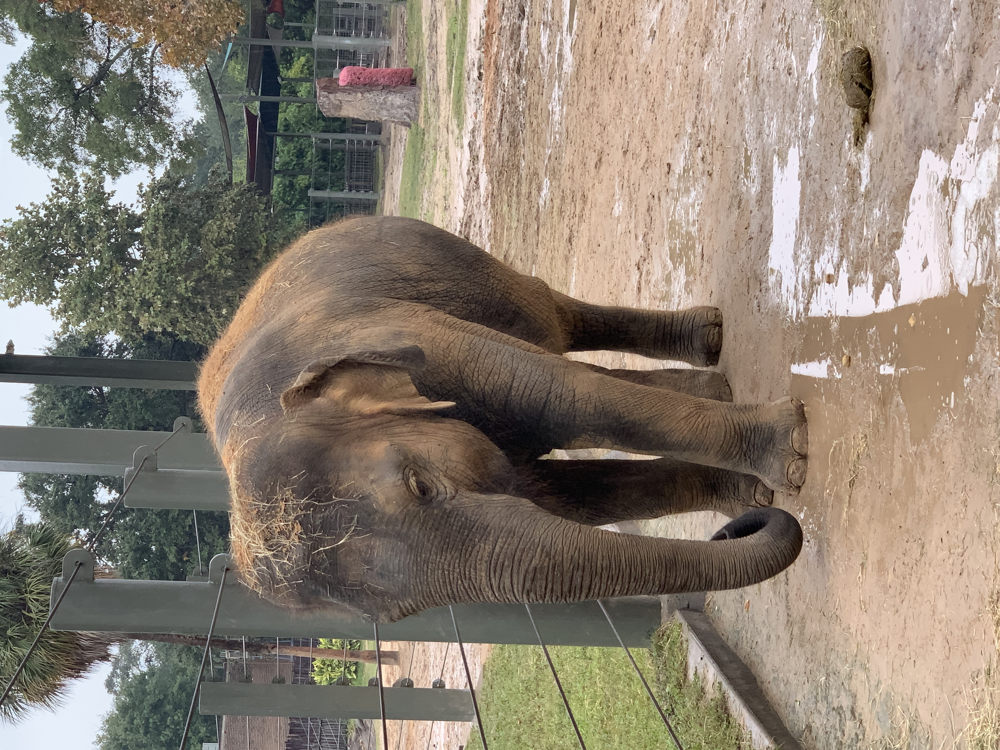

In [20]:
!wget https://github.com/sicara/tf2-yolov4/raw/master/notebooks/images/cars.jpg

from IPython.display import Image
# Image('./cars.jpg')
Image('/Users/deepakduggirala/Documents/Elephants-dataset/1000/IMG_1615.JPG')

In [70]:
img = Image('/Users/deepakduggirala/Documents/Elephants-dataset/1000/IMG_1615.JPG')

In [122]:
image = tf.io.read_file("/Users/deepakduggirala/Documents/Elephants-dataset/1039/IMG_3634.JPG")
image = tf.image.decode_image(image)
# image = tf.transpose(image, perm=[1,0,2])
print(image.shape)
image = tf.image.resize(image, (HEIGHT, WIDTH))
images = tf.expand_dims(image, axis=0) / 255.0

(3024, 4032, 3)


In [112]:
image.shape

TensorShape([640, 960, 3])

In [57]:
import numpy as np

In [123]:
img = image.numpy().astype(np.int32)
# img.transpose((1,0,2)).shape

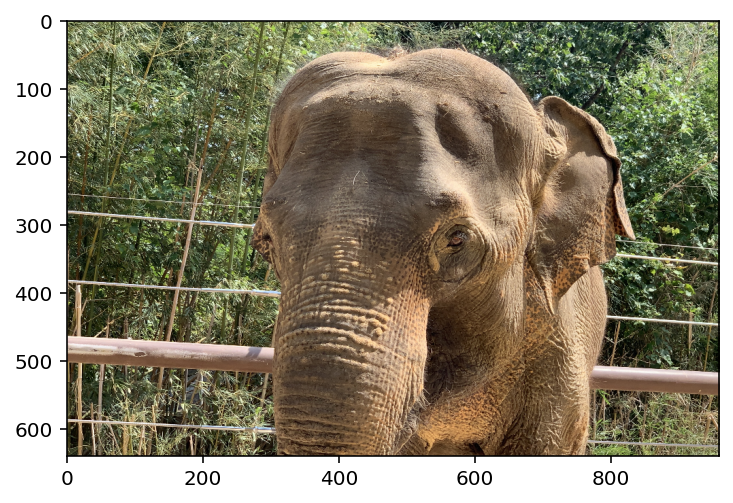

In [124]:
plt.imshow(img)

In [7]:
model = YOLOv4(
    input_shape=(HEIGHT, WIDTH, 3),
    anchors=YOLOV4_ANCHORS,
    num_classes=80,
    training=False,
    yolo_max_boxes=100,
    yolo_iou_threshold=0.5,
    yolo_score_threshold=0.5,
)

model.load_weights("./yolov4.h5")
model.summary()

Model: "YOLOv4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_8 (InputLayer)           [(None, 640, 960, 3  0           []                               
                                )]                                                                
                                                                                                  
 CSPDarknet53 (Functional)      [(None, 20, 30, 102  26652512    ['input_8[0][0]']                
                                4),                                                               
                                 (None, 40, 60, 512                                               
                                ),                                                                
                                 (None, 80, 120, 25                                          

In [125]:
boxes, scores, classes, valid_detections = model.predict(images)
valid_detections

array([1], dtype=int32)

In [24]:
boxes.shape

(1, 100, 4)

In [118]:
scores.shape

(1, 100)

In [26]:
classes.shape

(1, 100)

In [36]:
valid_detections

array([3], dtype=int32)

In [17]:
CLASSES = [
    'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack',
    'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis',
    'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'dining table',
    'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
]

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

In [30]:
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

def plot_results(pil_img, boxes, scores, classes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()

    for (xmin, ymin, xmax, ymax), score, cl in zip(boxes.tolist(), scores.tolist(), classes.tolist()):
        if score > 0:
          ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                    fill=False, color=COLORS[cl % 6], linewidth=3))
          text = f'{CLASSES[cl]}: {score:0.2f}'
          ax.text(xmin, ymin, text, fontsize=15,
                  bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()


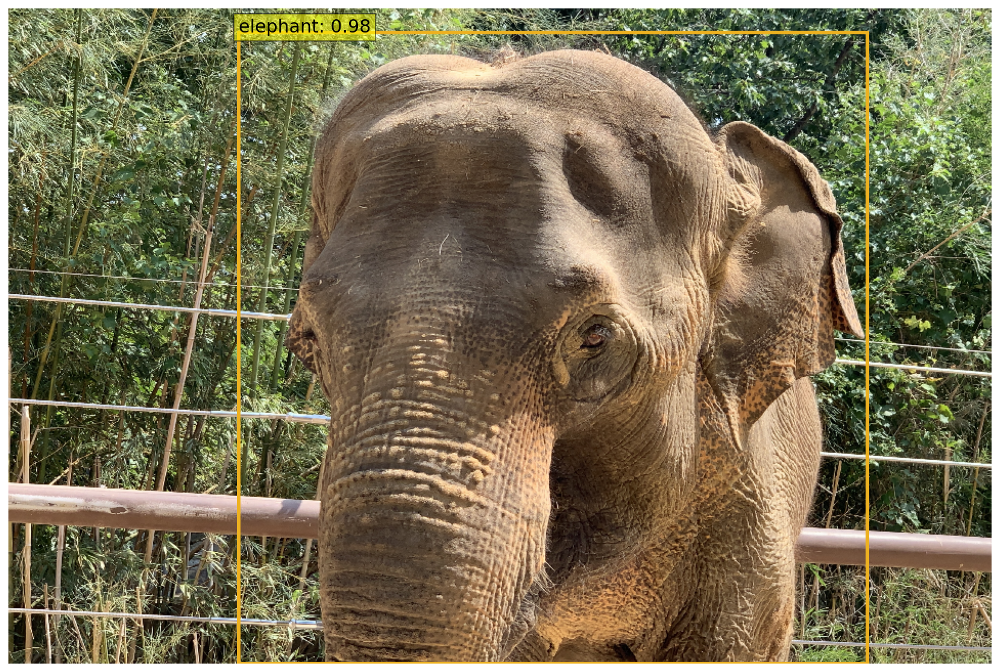

In [126]:


plot_results(
    images[0],
    boxes[0] * [WIDTH, HEIGHT, WIDTH, HEIGHT],
    scores[0],
    classes[0].astype(int),
)



In [127]:
import tensorflow_addons as tfa

In [130]:
tfa.losses.giou_loss

<function tensorflow_addons.losses.giou_loss.giou_loss(y_true: Union[List[Union[float, int, numpy.float16, numpy.float32, numpy.float64, numpy.int8, numpy.int16, numpy.int32, numpy.int64, numpy.uint8, numpy.uint16, numpy.uint32, numpy.uint64, list]], tuple, float, int, numpy.float16, numpy.float32, numpy.float64, numpy.int8, numpy.int16, numpy.int32, numpy.int64, numpy.uint8, numpy.uint16, numpy.uint32, numpy.uint64, numpy.ndarray, tensorflow.python.framework.ops.Tensor, tensorflow.python.framework.sparse_tensor.SparseTensor, tensorflow.python.ops.variables.Variable, keras.engine.keras_tensor.KerasTensor], y_pred: Union[List[Union[float, int, numpy.float16, numpy.float32, numpy.float64, numpy.int8, numpy.int16, numpy.int32, numpy.int64, numpy.uint8, numpy.uint16, numpy.uint32, numpy.uint64, list]], tuple, float, int, numpy.float16, numpy.float32, numpy.float64, numpy.int8, numpy.int16, numpy.int32, numpy.int64, numpy.uint8, numpy.uint16, numpy.uint32, numpy.uint64, numpy.ndarray, tenso

In [140]:
y_true = (boxes[0] * [WIDTH, HEIGHT, WIDTH, HEIGHT])[0]
y_true

array([223.97586823,  22.75571823, 838.37207794, 640.        ])

In [153]:
y_pred = np.array([200, 0, 600, 660])

In [154]:
1-tfa.losses.giou_loss(y_true, y_pred).numpy()

0.5403436422348022